# Predict Patient condition based on Drug Reviews and Recommend Best Drugs

# Business Objective:

# Importing Data

In [1]:
import pandas as pd

In [2]:
df=pd.read_csv("C:\\Users\\kalpana\\Downloads\\drugsCom_raw.tsv",sep='\t')

In [3]:
df.head()

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


In [4]:
df.shape

(161297, 7)

# Exploratory Data Analysis

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161297 entries, 0 to 161296
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   161297 non-null  int64  
 1   drugName     161297 non-null  object 
 2   condition    160398 non-null  object 
 3   review       161297 non-null  object 
 4   rating       161297 non-null  float64
 5   date         161297 non-null  object 
 6   usefulCount  161297 non-null  int64  
dtypes: float64(1), int64(2), object(4)
memory usage: 8.6+ MB


In [6]:
df.corr()

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Unnamed: 0,rating,usefulCount
Unnamed: 0,1.000000,0.015185,0.016475
rating,0.015185,1.000000,0.234185
usefulCount,0.016475,0.234185,1.000000


In [7]:
df.describe()

,Unnamed: 0,rating,usefulCount
count,161297.000000,161297.000000,161297.000000
mean,115923.585305,6.994377,28.004755
std,67004.445170,3.272329,36.403742
min,2.000000,1.000000,0.000000
25%,58063.000000,5.000000,6.000000
50%,115744.000000,8.000000,16.000000
75%,173776.000000,10.000000,36.000000
max,232291.000000,10.000000,1291.000000


In [8]:
df.isnull().sum()

Unnamed: 0       0
drugName         0
condition      899
review           0
rating           0
date             0
usefulCount      0
dtype: int64

In [9]:
df.duplicated().sum()

0

In [10]:
df.drop("Unnamed: 0",axis=1,inplace=True)
df.head()

,drugName,condition,review,rating,date,usefulCount
0,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


# Drop the rows which has null values


In [11]:
df.dropna(inplace=True)

In [12]:
df.isna().sum()

drugName       0
condition      0
review         0
rating         0
date           0
usefulCount    0
dtype: int64

In [13]:
import matplotlib as plt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [14]:
# What is the most popular drug?
df['condition'].value_counts()

Birth Control                                              28788
Depression                                                  9069
Pain                                                        6145
Anxiety                                                     5904
Acne                                                        5588
                                                           ...  
Dissociative Identity Disorde                                  1
Hydrocephalus                                                  1
Hyperlipoproteinemia Type III, Elevated beta-VLDL   IDL        1
Q Feve                                                         1
Neutropenia                                                    1
Name: condition, Length: 884, dtype: int64

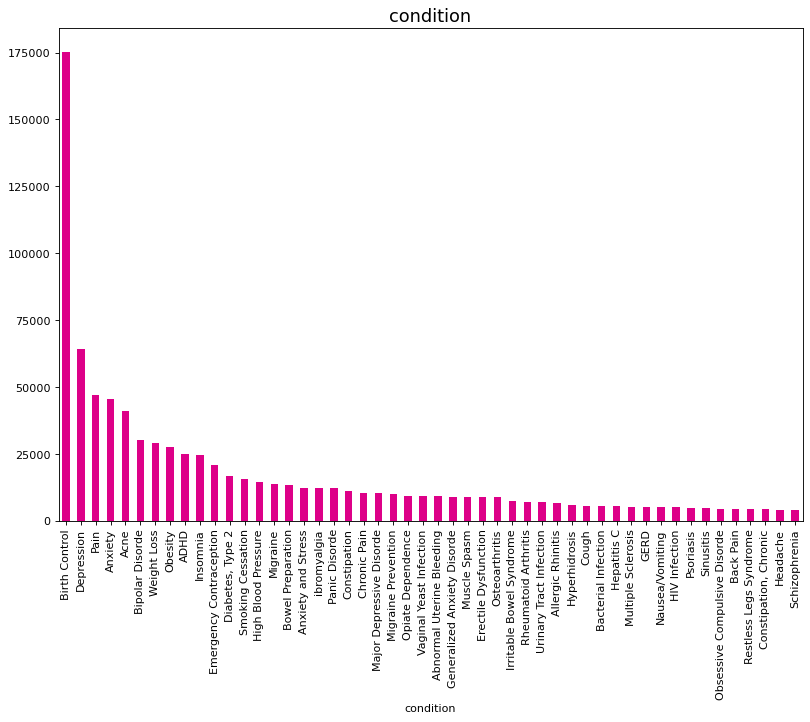

In [15]:
d=df.groupby("condition")["rating"].sum().nlargest(50)
plt.figure(figsize=(12,8),dpi=80)
d.plot.bar(color="#dd0088")
plt.title("condition",fontsize=16)
plt.show()

<AxesSubplot:>

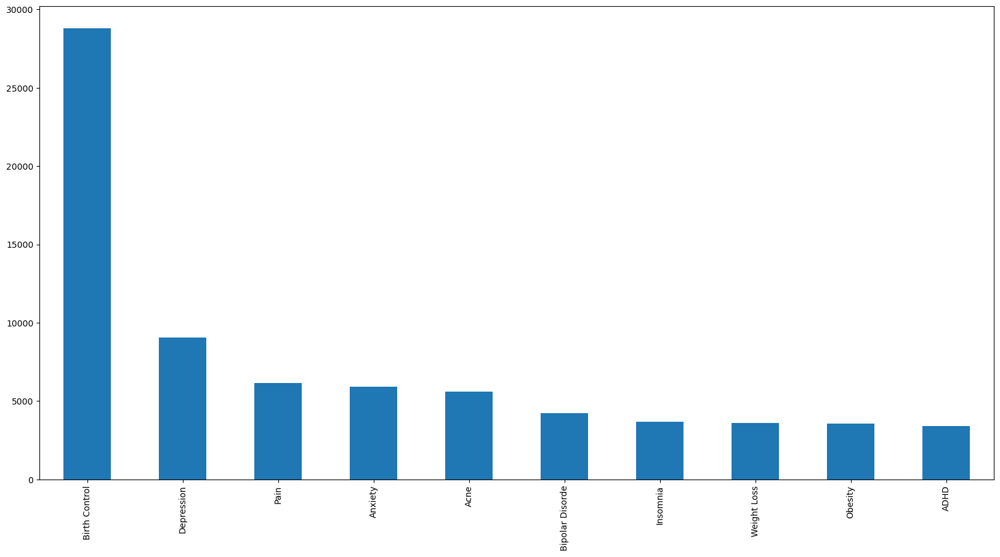

In [16]:
df['condition'].value_counts().nlargest(10).plot(kind='bar',figsize=(20,10))

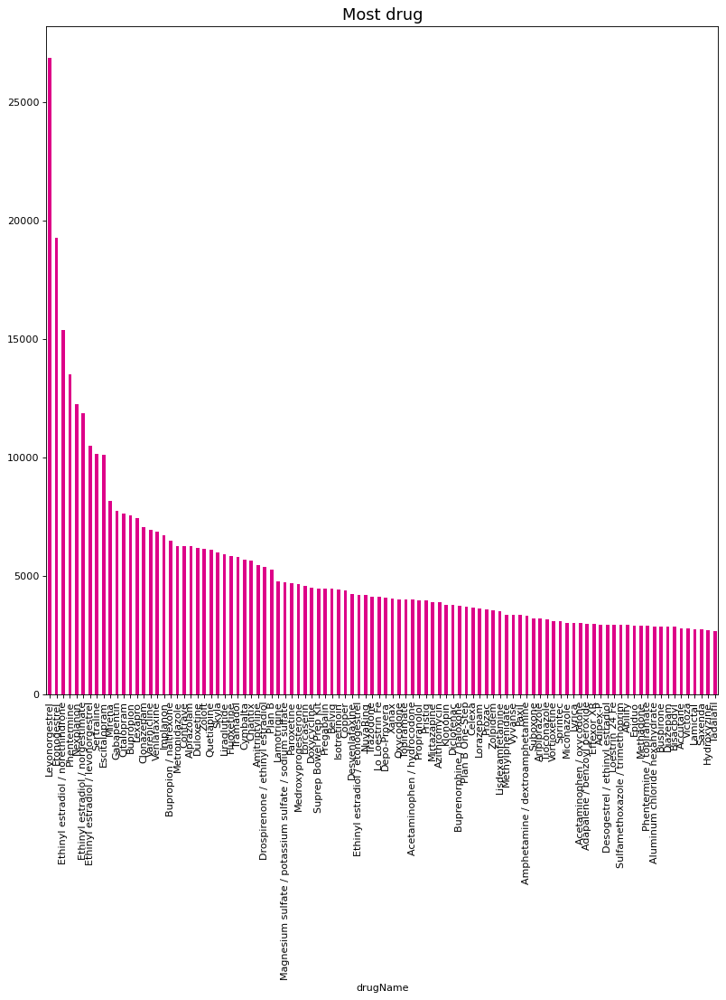

In [17]:
d1=df.groupby("drugName")["rating"].sum().nlargest(100)
plt.figure(figsize=(12,12),dpi=80)
d1.plot.bar(color="#dd0088")
plt.title("Most drug",fontsize=16)
plt.show()

In [18]:
import numpy as np
import pandas as pd
from plotnine import *


In [19]:
import plotly.express as px

In [20]:
df2 = df[df["condition"].isin(["Depression", "High Blood Pressure","Diabetes, Type 2"])]

In [21]:
df2.head()

,drugName,condition,review,rating,date,usefulCount
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,"October 24, 2017",24
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166


In [22]:
df2.shape

(13944, 6)

In [23]:
fig = px.pie(df2, values="rating", names="condition")
fig.show()

In [24]:
fig = px.pie(df2, values="usefulCount", names="condition")
fig.show()

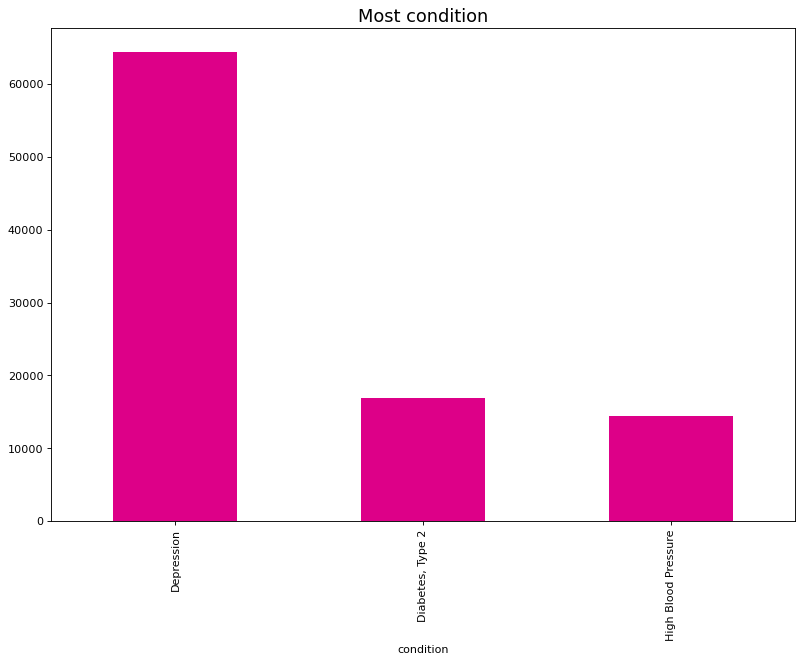

In [25]:
druge=df2.groupby("condition")["rating"].sum().nlargest(50)
plt.figure(figsize=(12,8),dpi=80)
druge.plot.bar(color="#dd0088")
plt.title("Most condition",fontsize=16)
plt.show()

# Depression Analysis

In [26]:
df3= df2[df2["condition"].isin(["Depression"])]

In [27]:
df3.head()

,drugName,condition,review,rating,date,usefulCount
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166
81,Wellbutrin,Depression,"""Started taking it and I slept well at night a...",4.0,"January 13, 2017",15


In [28]:
df3.shape

(9069, 6)

In [29]:
df3["drugName"].value_counts()

Bupropion         549
Sertraline        459
Venlafaxine       437
Pristiq           418
Desvenlafaxine    414
                 ... 
Luvox CR            1
Vyvanse             1
Tryptophan          1
Maprotiline         1
Niravam             1
Name: drugName, Length: 105, dtype: int64

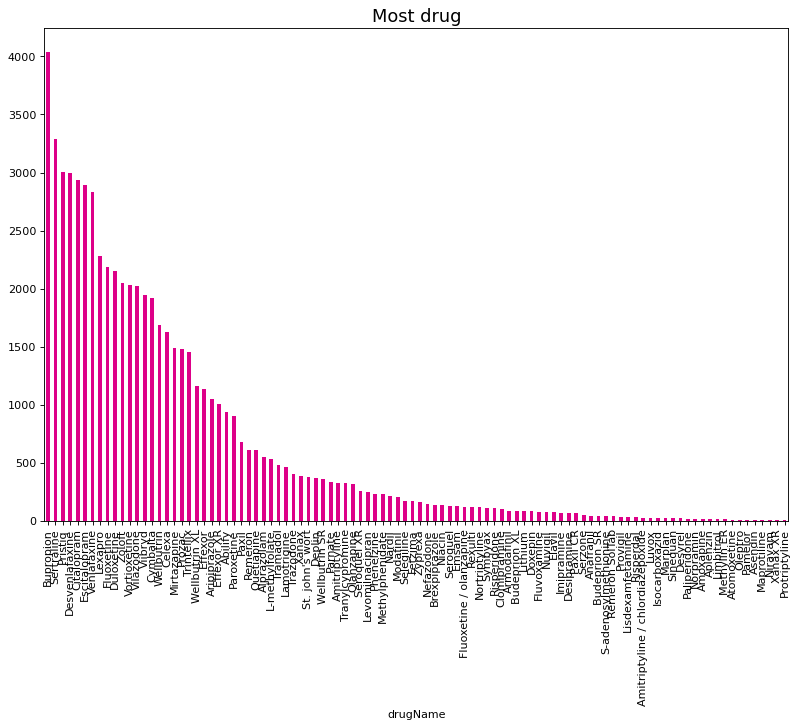

In [30]:
d3=df3.groupby("drugName")["rating"].sum().nlargest(100)
plt.figure(figsize=(12,8),dpi=80)
d3.plot.bar(color="#dd0088")
plt.title("Most drug",fontsize=16)
plt.show()

In [31]:
import plotly.express as px
 
# plotting the boxplot
fig = px.box(df3, x="drugName", y="rating")
 
# showing the plot
fig.show()

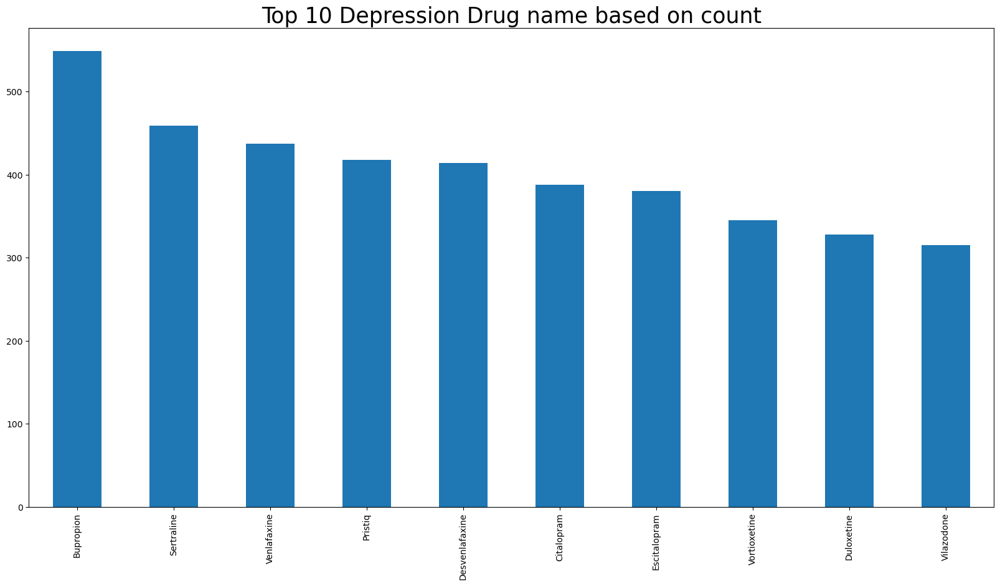

In [32]:
for i in ['drugName']:
    plt.figure(figsize=(20,10))
    df3[i].value_counts().nlargest(10).plot(kind='bar')
    plt.title("Top 10 Depression Drug name based on count",fontsize=25)
    plt.show()

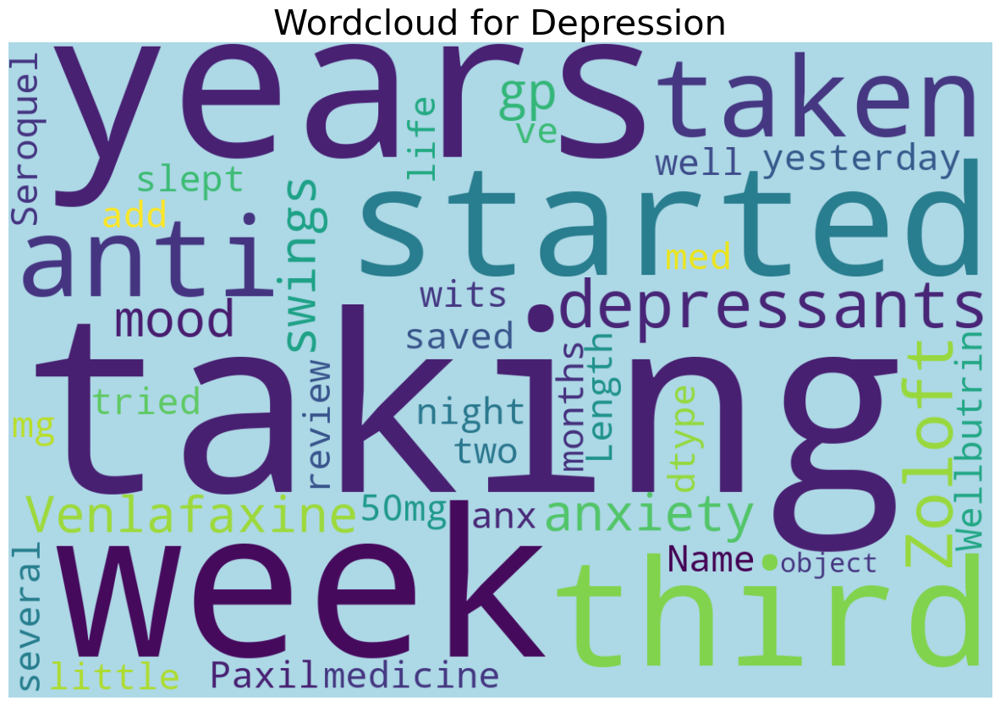

In [33]:
# making a word cloud for item categories name

from wordcloud import WordCloud
from wordcloud import STOPWORDS

plt.rcParams['figure.figsize'] = (15, 12)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = 'lightblue',
                      max_words = 200, 
                      stopwords = stopwords,
                     width = 1200,
                     height = 800,
                     random_state = 42).generate(str(df3['review']))


plt.title('Wordcloud for Depression', fontsize = 30)
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')

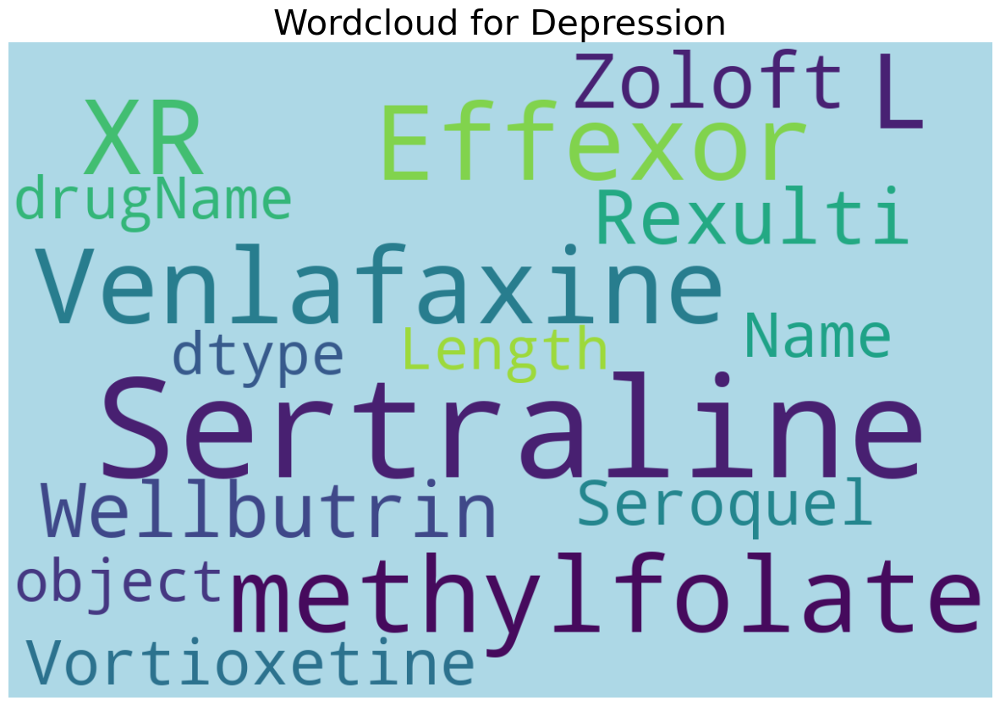

In [34]:
# making a word cloud for item categories name

from wordcloud import WordCloud
from wordcloud import STOPWORDS

plt.rcParams['figure.figsize'] = (15, 12)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = 'lightblue',
                      max_words = 200, 
                      stopwords = stopwords,
                     width = 1200,
                     height = 800,
                     random_state = 42).generate(str(df3['drugName']))


plt.title('Wordcloud for Depression', fontsize = 30)
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')

# High Blood Pressure Analysis

In [35]:
df4= df2[df2["condition"].isin(["High Blood Pressure"])]

In [36]:
df4.head()

,drugName,condition,review,rating,date,usefulCount
104,Amlodipine / olmesartan,High Blood Pressure,"""My blood pressure has been around 160/100. Do...",10.0,"January 19, 2015",10
185,Lisinopril,High Blood Pressure,"""I&#039;m a 27 year old white male in good sha...",10.0,"December 9, 2011",55
205,Metoprolol,High Blood Pressure,"""I have been on metoprolol er 12.5mg since Sep...",2.0,"November 3, 2016",19
363,Prazosin,High Blood Pressure,"""Using this for parasomnia, bph and bp. Kind o...",6.0,"November 6, 2016",2
447,Metoprolol,High Blood Pressure,"""I took Lopressor for 24 years it worked very ...",10.0,"June 24, 2014",55


In [37]:
df4.shape

(2321, 6)

In [38]:
df4["drugName"].value_counts()

Lisinopril                   264
Losartan                     166
Amlodipine                   153
Nebivolol                    110
Bystolic                      99
                            ... 
Normodyne                      1
Torsemide                      1
Amlodipine / atorvastatin      1
Corzide 80 / 5                 1
Aldomet                        1
Name: drugName, Length: 140, dtype: int64

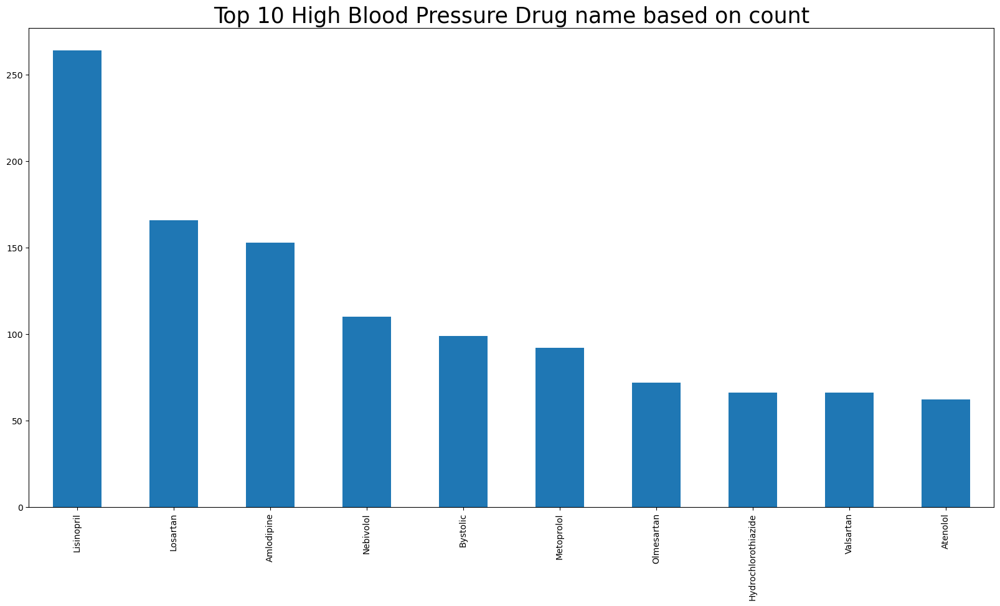

In [39]:
for i in ['drugName']:
    plt.figure(figsize=(20,10))
    df4[i].value_counts().nlargest(10).plot(kind='bar')
    plt.title("Top 10 High Blood Pressure Drug name based on count",fontsize=25)
    plt.show()

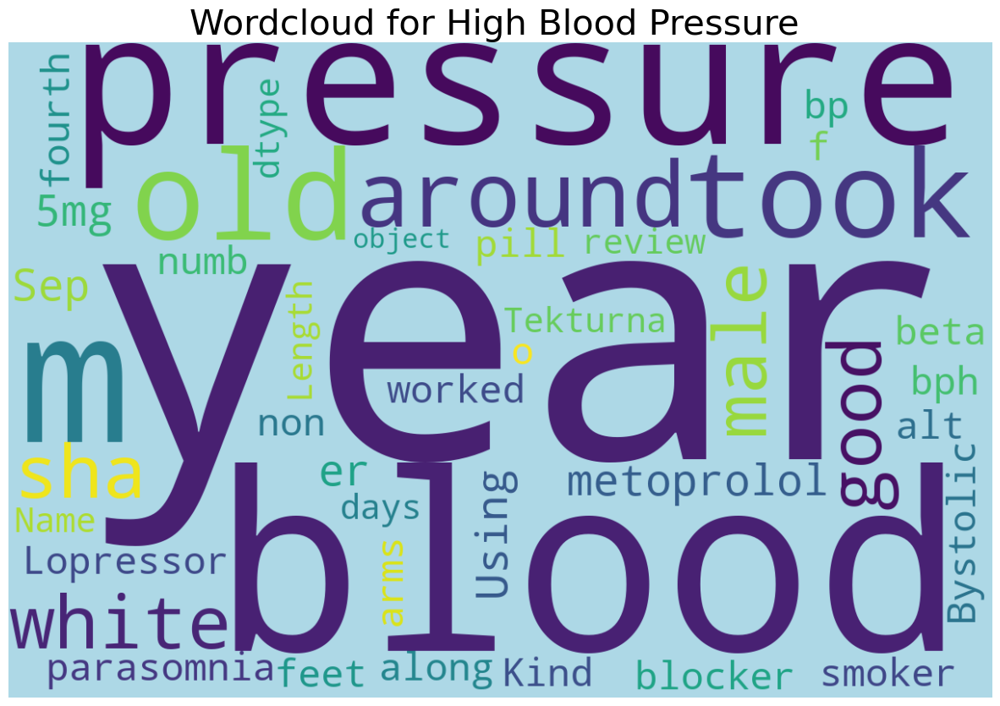

In [40]:
# making a word cloud for item categories name

from wordcloud import WordCloud
from wordcloud import STOPWORDS

plt.rcParams['figure.figsize'] = (15, 12)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = 'lightblue',
                      max_words = 200, 
                      stopwords = stopwords,
                     width = 1200,
                     height = 800,
                     random_state = 42).generate(str(df4['review']))


plt.title('Wordcloud for High Blood Pressure ', fontsize = 30)
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')

# "Diabetes, Type 2"

In [41]:
df5= df2[df2["condition"].isin(["Diabetes, Type 2"])]

In [42]:
df5.shape

(2554, 6)

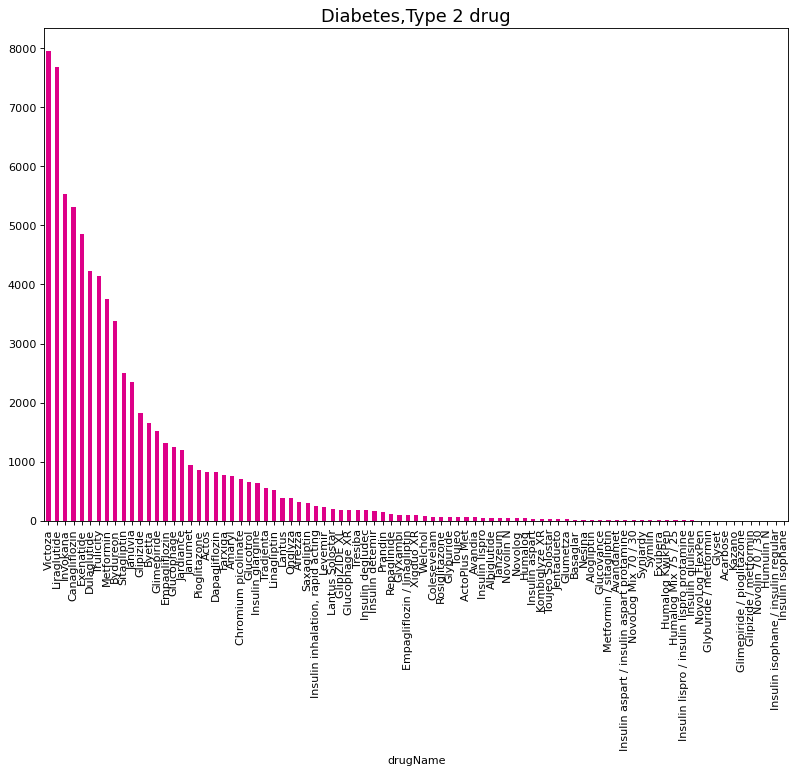

In [43]:
d5=df5.groupby("drugName")["usefulCount"].sum().nlargest(100)
plt.figure(figsize=(12,8),dpi=80)
d5.plot.bar(color="#dd0088")
plt.title("Diabetes,Type 2 drug",fontsize=16)
plt.show()

In [44]:
df5["drugName"].value_counts()

Liraglutide                   270
Victoza                       255
Dulaglutide                   231
Trulicity                     221
Exenatide                     192
                             ... 
Glimepiride / pioglitazone      1
Glucovance                      1
Synjardy                        1
Humulin N                       1
Acarbose                        1
Name: drugName, Length: 89, dtype: int64

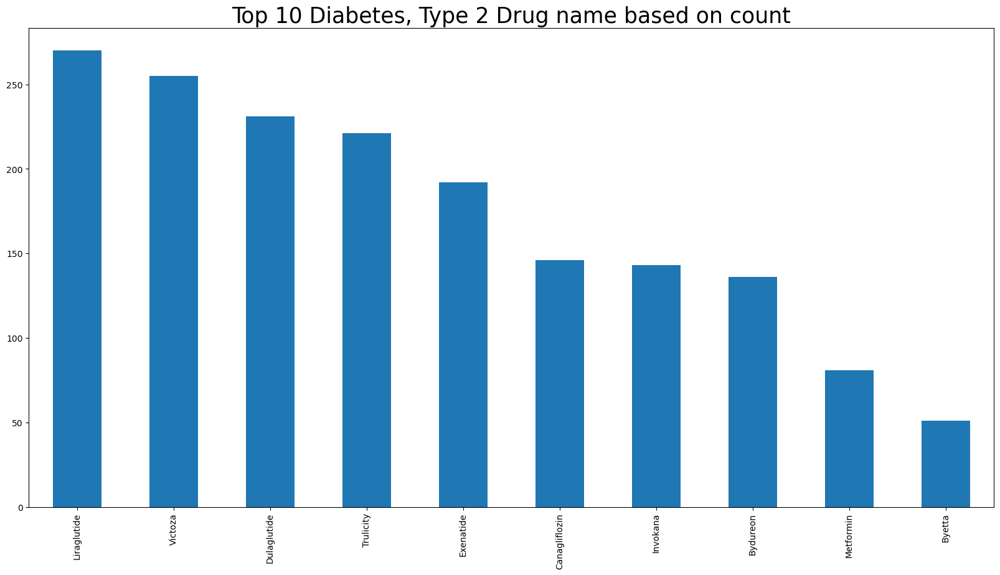

In [45]:
for i in ['drugName']:
    plt.figure(figsize=(20,10))
    df5[i].value_counts().nlargest(10).plot(kind='bar')
    plt.title("Top 10 Diabetes, Type 2 Drug name based on count",fontsize=25)
    plt.show()

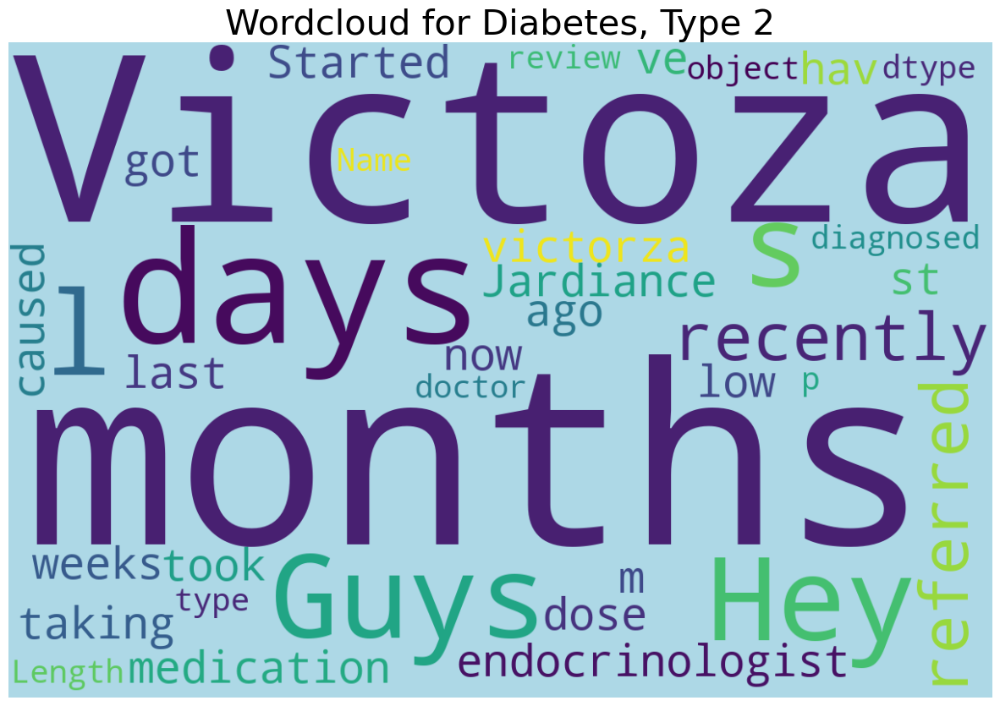

In [46]:
# making a word cloud for item categories name

from wordcloud import WordCloud
from wordcloud import STOPWORDS

plt.rcParams['figure.figsize'] = (15, 12)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(background_color = 'lightblue',
                      max_words = 200, 
                      stopwords = stopwords,
                     width = 1200,
                     height = 800,
                     random_state = 42).generate(str(df5['review']))


plt.title('Wordcloud for Diabetes, Type 2', fontsize = 30)
plt.axis('off')
plt.imshow(wordcloud, interpolation = 'bilinear')

# Preprocess

In [47]:
from datetime import date
import snscrape.modules.twitter as sntwitter
import pandas as pd
import numpy as np
from textblob import TextBlob
from wordcloud import WordCloud
import re
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import nltk
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords
import spacy

In [48]:
#clean the Review with a function
def cleanReview(text):
    text = re.sub('@[A-Za-z0-9_]+', '', text) #removes @mentions
    text = re.sub('#','',text) #removes hastag '#' symbol
    text = re.sub('RT[\s]+','',text)
    text = re.sub('https?:\/\/\S+', '', text) 
    text = re.sub('\n',' ',text)
    return text
df2[' cleanReview'] = df2['review'].apply( cleanReview) #apply cleanTweet function to the Review
df2.head() #compares original tweets with cleaned REVIEW

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\985930421.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,drugName,condition,review,rating,date,usefulCount,cleanReview
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54,"""I have taken anti-depressants for years, with..."
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3,"""1 week on Zoloft for anxiety and mood swings...."
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3,"""my gp started me on Venlafaxine yesterday to ..."
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,"October 24, 2017",24,"""Hey Guys, It&039;s been 4 months since my la..."
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166,"""This medicine saved my life. I was at my wits..."


In [49]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13944 entries, 11 to 161290
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   drugName      13944 non-null  object 
 1   condition     13944 non-null  object 
 2   review        13944 non-null  object 
 3   rating        13944 non-null  float64
 4   date          13944 non-null  object 
 5   usefulCount   13944 non-null  int64  
 6    cleanReview  13944 non-null  object 
dtypes: float64(1), int64(1), object(5)
memory usage: 871.5+ KB


In [50]:
import pandas as pd
from textblob import TextBlob

In [51]:
def get_sentiment(review):
    blob = TextBlob(review)
    return blob.sentiment.polarity

In [52]:
df2['sentiment_score'] = df2[' cleanReview'].apply(get_sentiment)

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\1136951196.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
df2.head()

,drugName,condition,review,rating,date,usefulCount,cleanReview,sentiment_score
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54,"""I have taken anti-depressants for years, with...",0.275000
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3,"""1 week on Zoloft for anxiety and mood swings....",0.166667
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3,"""my gp started me on Venlafaxine yesterday to ...",-0.136508
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,"October 24, 2017",24,"""Hey Guys, It&039;s been 4 months since my la...",0.103571
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166,"""This medicine saved my life. I was at my wits...",0.168194


In [54]:
fig = px.pie(df2, values="sentiment_score", names="condition")
fig.show()

In [55]:
def get_sentiment_label(sentiment_score):
    if sentiment_score > 0.1:
        return 'Positive'
    elif sentiment_score < -0.1:
        return 'Negative'
    else:
        return 'Neutral'

In [56]:
df2['sentiment_label'] = df2['sentiment_score'].apply(get_sentiment_label)

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\1796353422.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
df2.head()

,drugName,condition,review,rating,date,usefulCount,cleanReview,sentiment_score,sentiment_label
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,"March 9, 2017",54,"""I have taken anti-depressants for years, with...",0.275000,Positive
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,"May 7, 2011",3,"""1 week on Zoloft for anxiety and mood swings....",0.166667,Positive
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,"April 27, 2016",3,"""my gp started me on Venlafaxine yesterday to ...",-0.136508,Negative
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,"October 24, 2017",24,"""Hey Guys, It&039;s been 4 months since my la...",0.103571,Positive
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,"June 20, 2013",166,"""This medicine saved my life. I was at my wits...",0.168194,Positive


In [58]:
import numpy as np
import pandas as pd
from plotnine import *


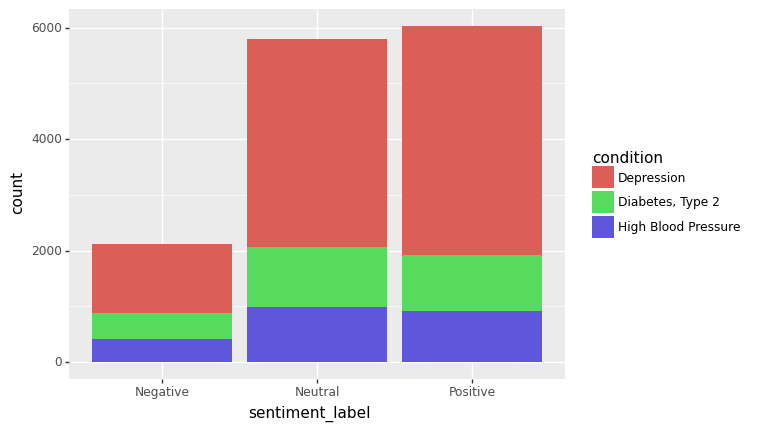

<ggplot: (112164851999)>

In [59]:
ggplot(df2, aes(x='sentiment_label', fill = 'condition')) + \
    geom_bar(stat = 'count')

# Drug Name Analysis

In [60]:
df6= df2[df2["drugName"].isin(["Bupropion","Sertraline","Desvenlafaxine"])]

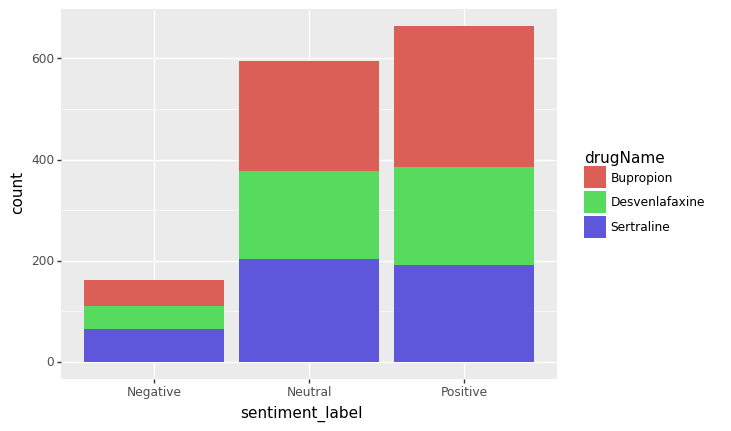

<ggplot: (112165018097)>

In [61]:
ggplot(df6, aes(x='sentiment_label', fill = 'drugName')) + \
    geom_bar(stat = 'count')

# we plot the countplot for the Year,Month and day wise distribution of reviews

In [62]:
 #converting the date into datetime format
df2['date'] = pd.to_datetime(df2['date'], errors = 'coerce')

# extracting year from date
df2['Year'] = df2['date'].dt.year

# extracting the month from the date
df2['month'] = df2['date'].dt.month
# extracting the days from the date
df2['day'] = df2['date'].dt.day

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\500220145.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\500220145.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\500220145.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [63]:
df2.head()

,drugName,condition,review,rating,date,usefulCount,cleanReview,sentiment_score,sentiment_label,Year,month,day
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,2017-03-09,54,"""I have taken anti-depressants for years, with...",0.275000,Positive,2017,3,9
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,2011-05-07,3,"""1 week on Zoloft for anxiety and mood swings....",0.166667,Positive,2011,5,7
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,2016-04-27,3,"""my gp started me on Venlafaxine yesterday to ...",-0.136508,Negative,2016,4,27
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,2017-10-24,24,"""Hey Guys, It&039;s been 4 months since my la...",0.103571,Positive,2017,10,24
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,2013-06-20,166,"""This medicine saved my life. I was at my wits...",0.168194,Positive,2013,6,20


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



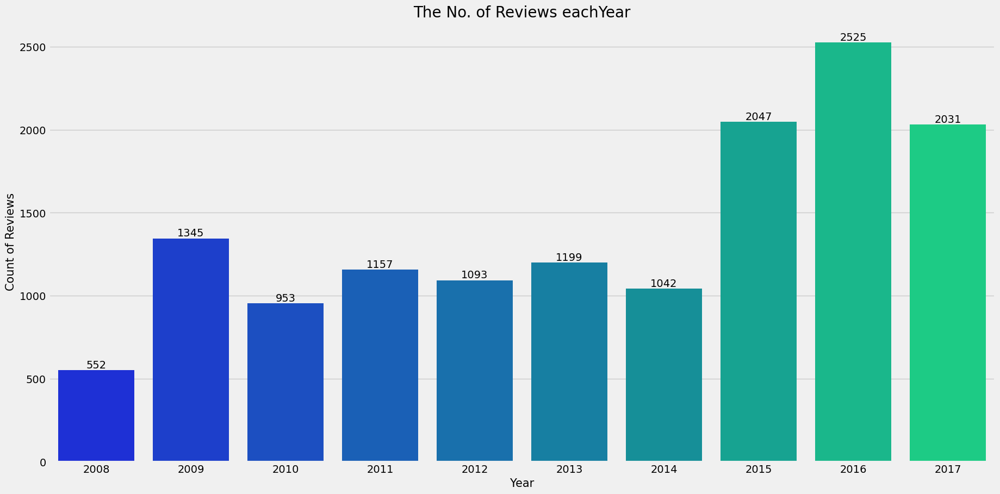

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



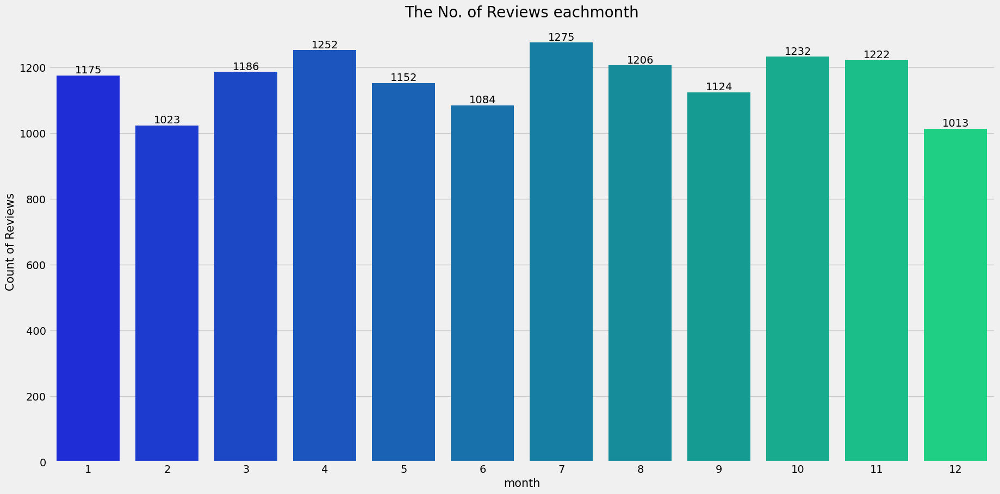

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



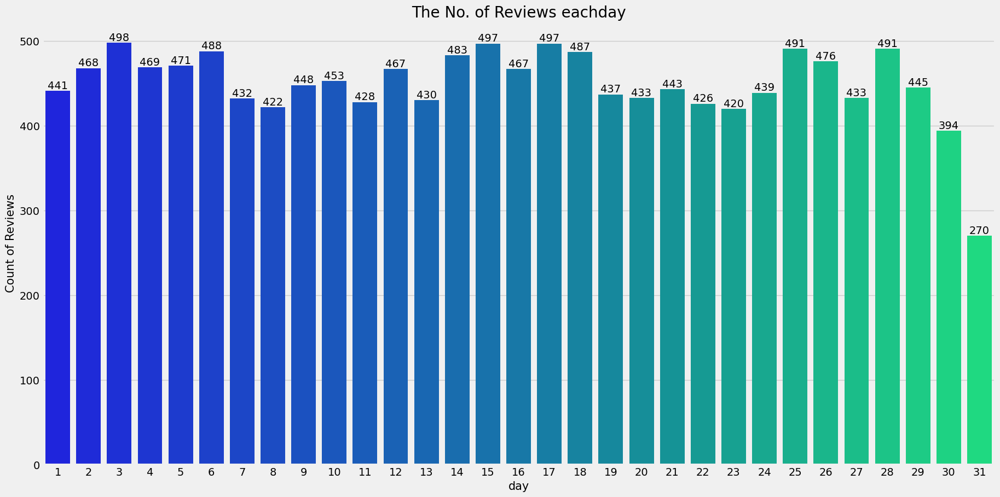

In [64]:
for i in ['Year','month','day']:   
    plt.figure(figsize=(20,10))
    cp=sns.countplot(df2[i],palette='winter')
    for a in cp.containers:
        cp.bar_label(a,)
    
    plt.title('The No. of Reviews each' +i,fontsize=20)
    plt.xlabel(i, fontsize = 15)
    plt.ylabel('Count of Reviews', fontsize = 15)
    plt.show()

C:\Users\kalpana\AppData\Local\Temp\ipykernel_15212\3774210671.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot:>

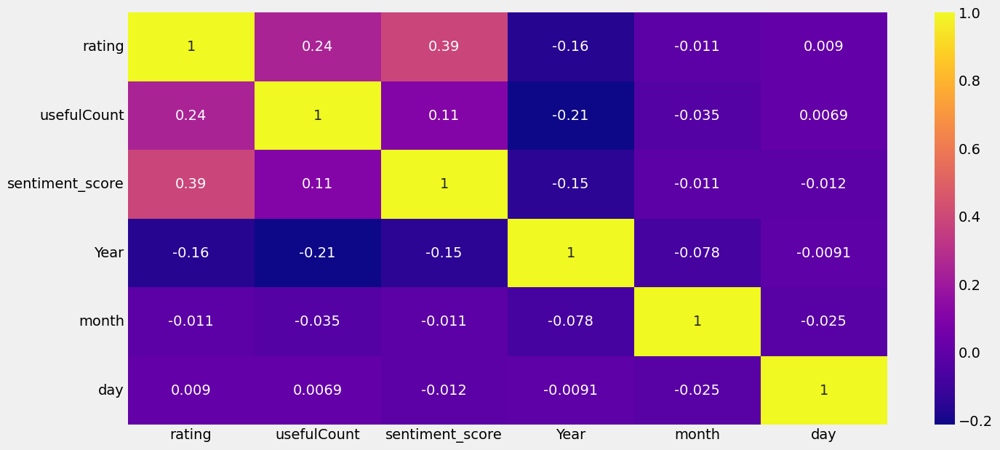

In [65]:
plt.figure(figsize=(15,7))
sns.heatmap(df2.corr(),annot=True,cmap='plasma')

# Declaring features & target

In [66]:
df2.head(5)

,drugName,condition,review,rating,date,usefulCount,cleanReview,sentiment_score,sentiment_label,Year,month,day
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",10.0,2017-03-09,54,"""I have taken anti-depressants for years, with...",0.275000,Positive,2017,3,9
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",8.0,2011-05-07,3,"""1 week on Zoloft for anxiety and mood swings....",0.166667,Positive,2011,5,7
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",4.0,2016-04-27,3,"""my gp started me on Venlafaxine yesterday to ...",-0.136508,Negative,2016,4,27
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&#039;s been 4 months since my l...",10.0,2017-10-24,24,"""Hey Guys, It&039;s been 4 months since my la...",0.103571,Positive,2017,10,24
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",10.0,2013-06-20,166,"""This medicine saved my life. I was at my wits...",0.168194,Positive,2013,6,20


In [67]:
# select only three columns from the DataFrame
new_df2 = df2[['drugName', 'condition',' cleanReview']]

In [68]:
new_df2.head()

,drugName,condition,cleanReview
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with..."
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings...."
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ..."
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&039;s been 4 months since my la..."
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits..."


In [69]:
import pandas as pd 
import numpy as np
import seaborn as sn
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer

from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from lightgbm import LGBMModel, LGBMClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.metrics import *

import warnings
warnings.simplefilter('ignore')

In [70]:
import re
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\kalpana\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [71]:
# Pre-process data
stop_words=set(stopwords.words('english'))
stemmer= SnowballStemmer('english')

In [72]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\kalpana\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [73]:
def preprocess_text(text):
    #Remove Punctuation and special characters
    text=re.sub(r"[^a-zA-Z0-9]", " ",text.lower())
    
    # Tokenize The text
    tokens=nltk.word_tokenize(text)
    
    #Remove the stopwords
    tokens=[token for token in tokens if token not in stop_words]
    
    #stem the tokens
    stemmed_tokens=[stemmer.stem(token) for token in tokens]
    return " ".join(stemmed_tokens)

new_df2['cleanReview']=new_df2[' cleanReview'].apply(preprocess_text)
new_df2.head()

,drugName,condition,cleanReview,cleanReview
11,L-methylfolate,Depression,"""I have taken anti-depressants for years, with...",taken anti depress year improv most moder seve...
31,Sertraline,Depression,"""1 week on Zoloft for anxiety and mood swings....",1 week zoloft anxieti mood swing take 50mg mor...
44,Venlafaxine,Depression,"""my gp started me on Venlafaxine yesterday to ...",gp start venlafaxin yesterday help depress cha...
50,Dulaglutide,"Diabetes, Type 2","""Hey Guys, It&039;s been 4 months since my la...",hey guy 039 4 month sinc last post want give m...
67,Effexor XR,Depression,"""This medicine saved my life. I was at my wits...",medicin save life wit end anti depress readi g...


# MODEL BUILDING

In [74]:
#The TfidfVectorizer converts a collection of raw documents into a matrix of TF-IDF features.#

In [75]:
# Convert the text data into numerical features using TF-IDF
vectorizer =TfidfVectorizer()
X = vectorizer.fit_transform(new_df2['cleanReview'])

y = new_df2["condition"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=90)
print('X_train:',X_train.shape)
print('y_train:',y_train.shape)
print('X_test:',X_test.shape)
print('X_test:',X_test.shape)

X_train: (10458, 9902)
y_train: (10458,)
X_test: (3486, 9902)
X_test: (3486, 9902)


In [76]:
X_test

<3486x9902 sparse matrix of type '<class 'numpy.float64'>'
	with 126134 stored elements in Compressed Sparse Row format>

In [77]:
y_test

16827        Diabetes, Type 2
142645             Depression
3419               Depression
13225        Diabetes, Type 2
21292              Depression
                 ...         
105015             Depression
100698       Diabetes, Type 2
67974     High Blood Pressure
17608              Depression
116667             Depression
Name: condition, Length: 3486, dtype: object

# Multinomial Naive Bayes Theoram

Training Accuracy:90.05% 
Test Accuracy:88.64% 
Precision: 89.95% 
Recall: 88.64% 
f1_score: 87.92% 
                     precision    recall  f1-score   support

         Depression       0.86      1.00      0.92      2265
   Diabetes, Type 2       0.98      0.75      0.85       644
High Blood Pressure       0.97      0.60      0.74       577

           accuracy                           0.89      3486
          macro avg       0.94      0.78      0.84      3486
       weighted avg       0.90      0.89      0.88      3486



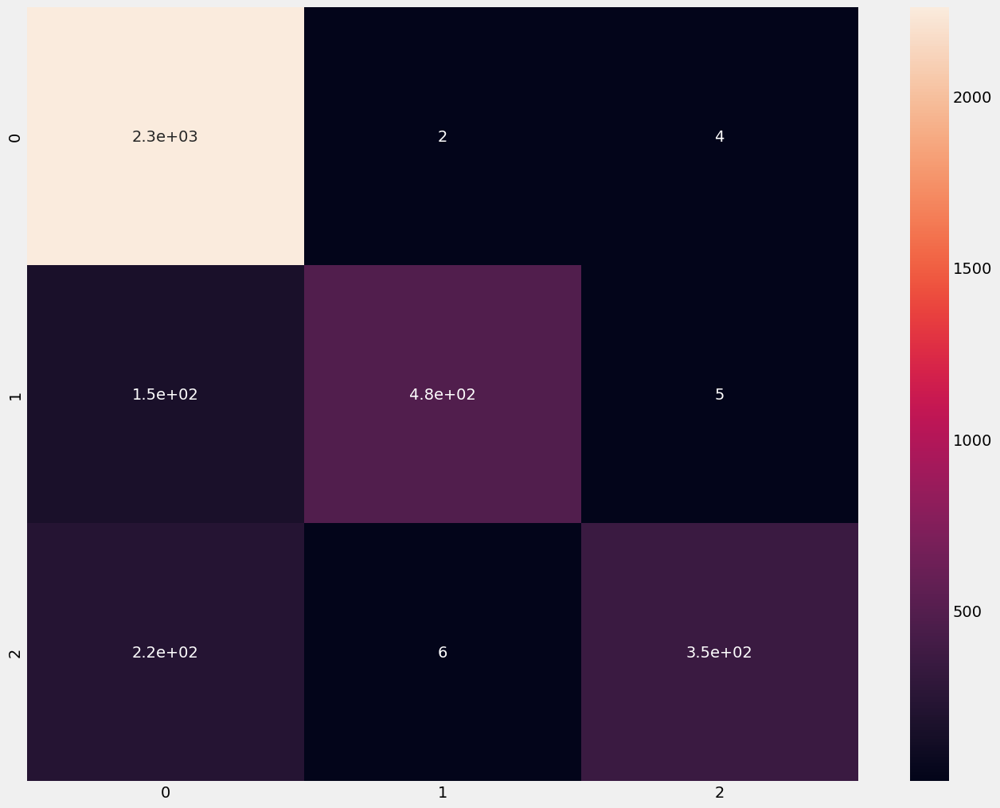

In [78]:
# Train the naive model
model_m=MultinomialNB()
model_m.fit(X_train,y_train)

# Evaluate Model
y_pred_m=model_m.predict(X_test)
y_pred_mt=model_m.predict(X_train)

accuracy_n=accuracy_score(y_test,y_pred_m)*100

print('Training Accuracy:{:.2f}% '.format(accuracy_score(y_train,y_pred_mt)*100))
print('Test Accuracy:{:.2f}% '.format(accuracy_n))

print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_m,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_m,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_m,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_m),annot=True)
print(classification_report(y_test,y_pred_m))
 

# Logistic Model

Accuracy: 88.64% 
Precision: 89.95% 
Recall: 88.64% 
f1_score: 87.92% 
                     precision    recall  f1-score   support

         Depression       0.86      1.00      0.92      2265
   Diabetes, Type 2       0.98      0.75      0.85       644
High Blood Pressure       0.97      0.60      0.74       577

           accuracy                           0.89      3486
          macro avg       0.94      0.78      0.84      3486
       weighted avg       0.90      0.89      0.88      3486



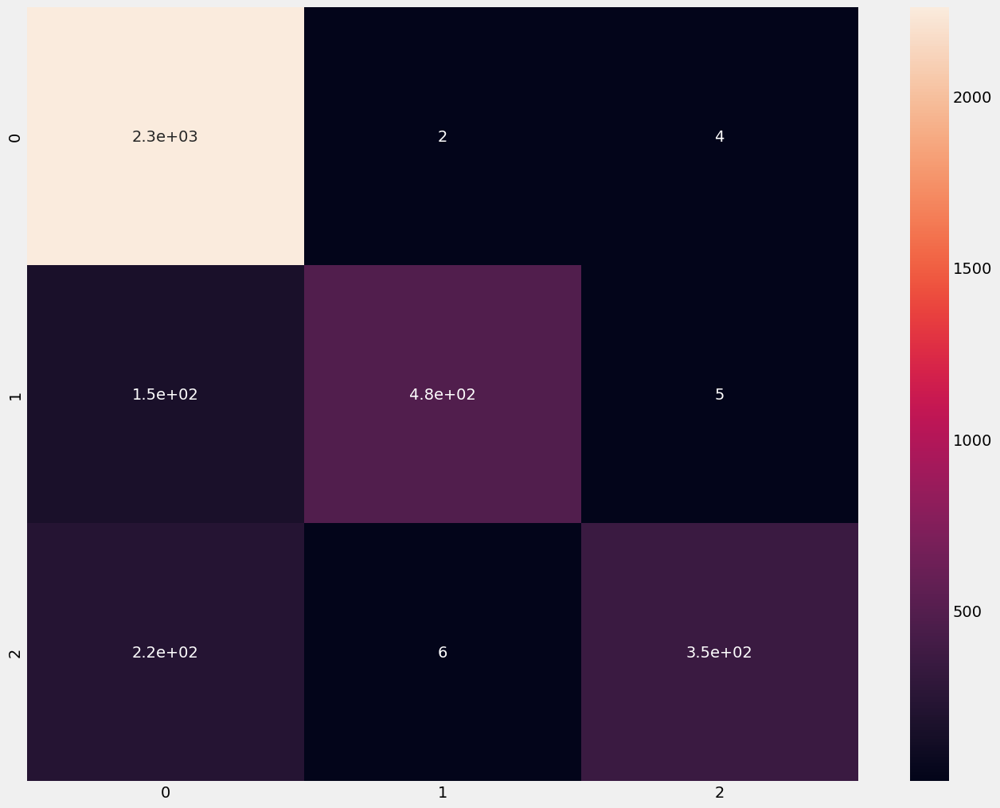

In [79]:
# Train the Logistics model
model_lr=LogisticRegression()
model_lr.fit(X_train,y_train)

# Evaluate Model
y_pred_lr=model_m.predict(X_test)
accuracy_lr=accuracy_score(y_test,y_pred_lr)*100

print('Accuracy: {:.2f}% '.format(accuracy_lr))
print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_lr,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_lr,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_lr,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_lr),annot=True)
print(classification_report(y_test,y_pred_lr))
 

# Support Vector Machine

Test Accuracy:95.75% 
Precision: 95.81% 
Recall: 95.75% 
f1_score: 95.69% 
                     precision    recall  f1-score   support

         Depression       0.95      0.99      0.97      2265
   Diabetes, Type 2       0.98      0.92      0.95       644
High Blood Pressure       0.96      0.86      0.91       577

           accuracy                           0.96      3486
          macro avg       0.96      0.92      0.94      3486
       weighted avg       0.96      0.96      0.96      3486



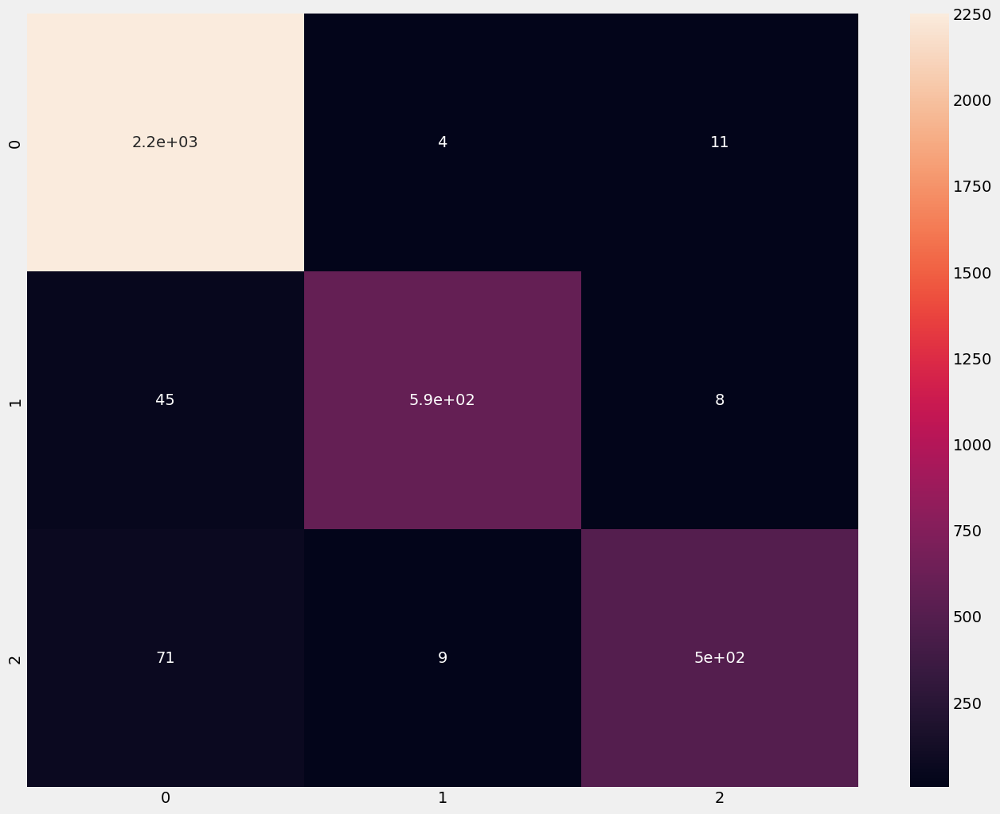

In [80]:
# Train the SVC model
model_s=SVC()
model_s.fit(X_train,y_train)

# Evaluate Model
y_pred_s=model_s.predict(X_test)

accuracy_svc=accuracy_score(y_test,y_pred_s)*100

print('Test Accuracy:{:.2f}% '.format(accuracy_svc))
print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_s,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_s,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_s,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_s),annot=True)
print(classification_report(y_test,y_pred_s))

# Decision Tree

Accuracy: 85.14% 
Precision: 87.06% 
Recall: 85.14% 
f1_score: 83.90% 
                     precision    recall  f1-score   support

         Depression       0.82      0.99      0.90      2265
   Diabetes, Type 2       0.98      0.52      0.68       644
High Blood Pressure       0.94      0.66      0.77       577

           accuracy                           0.85      3486
          macro avg       0.91      0.73      0.79      3486
       weighted avg       0.87      0.85      0.84      3486



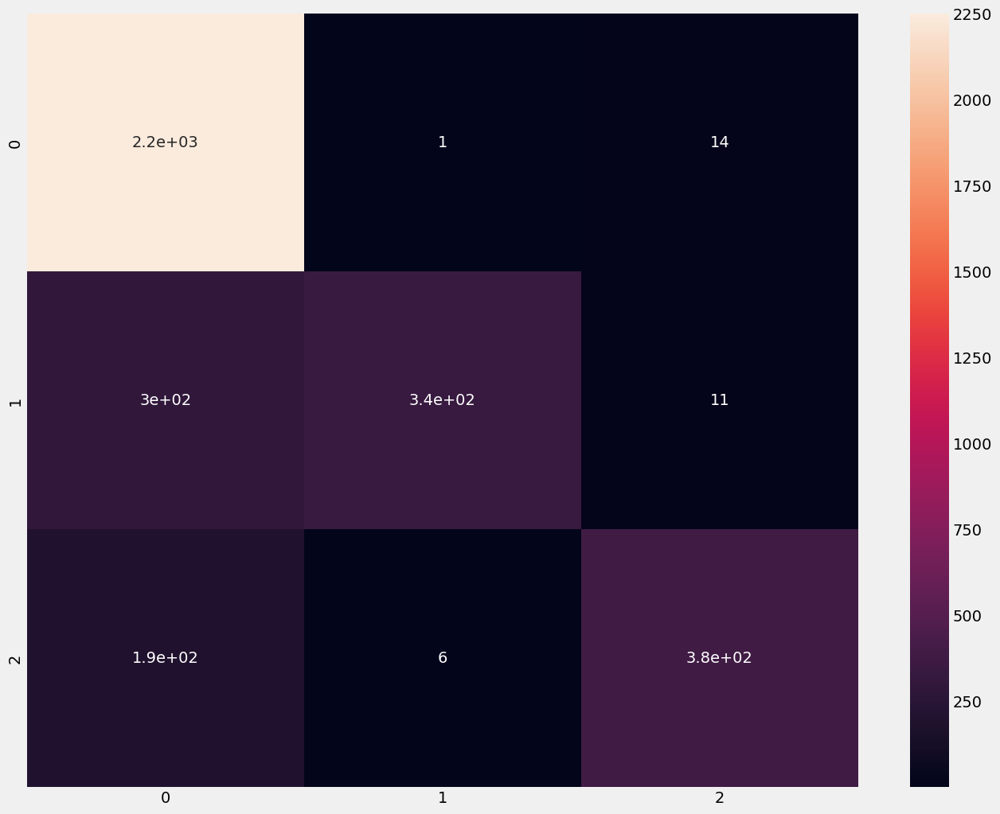

In [81]:
# Train the decision tree model
model_dt=DecisionTreeClassifier(criterion="entropy",random_state=45,max_depth=5)
model_dt.fit(X_train,y_train)

# Evaluate Model
y_pred_dt=model_dt.predict(X_test)
accuracy_dt=accuracy_score(y_test,y_pred_dt)*100

print('Accuracy: {:.2f}% '.format(accuracy_dt))
print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_dt,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_dt,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_dt,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_dt),annot=True)
print(classification_report(y_test,y_pred_dt))
 

# Random Forest with Ensemble Technique

Accuracy: 95.47% 
Precision: 95.58% 
Recall: 95.47% 
f1_score: 95.39% 
                     precision    recall  f1-score   support

         Depression       0.94      0.99      0.97      2265
   Diabetes, Type 2       0.98      0.91      0.95       644
High Blood Pressure       0.97      0.85      0.91       577

           accuracy                           0.95      3486
          macro avg       0.97      0.92      0.94      3486
       weighted avg       0.96      0.95      0.95      3486



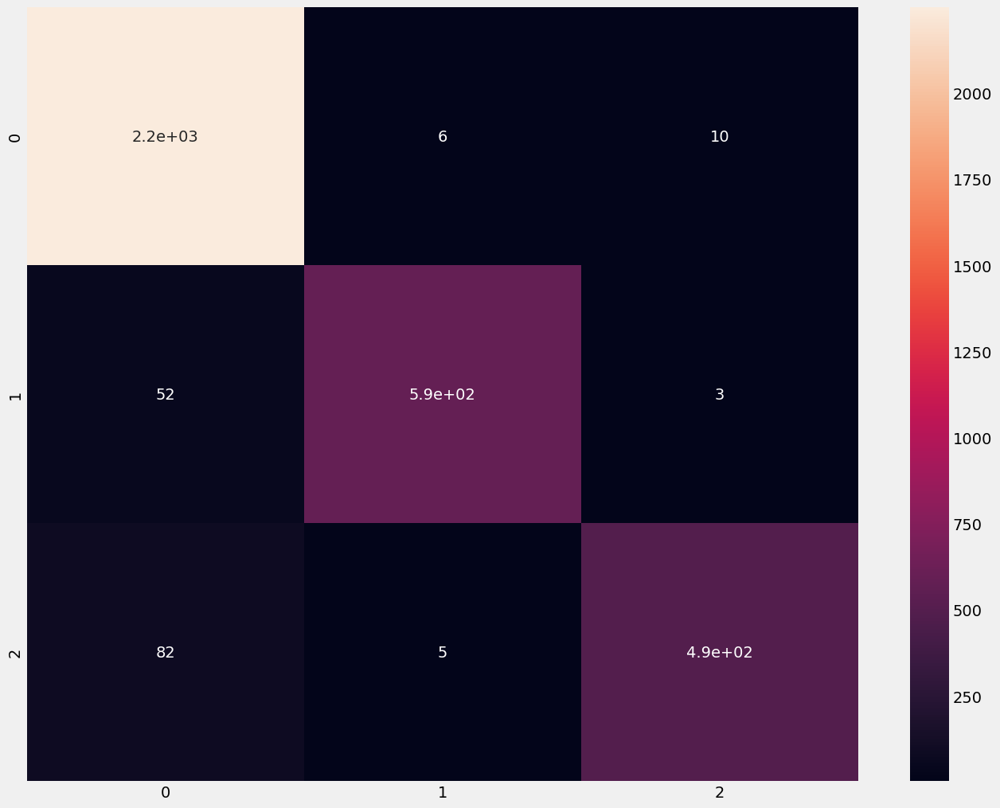

In [82]:
# Train the Ensemble (Random Forest) model
model_en=RandomForestClassifier()
model_en.fit(X_train,y_train)

# Evaluate Model
y_pred_en=model_en.predict(X_test)
accuracy_en=accuracy_score(y_test,y_pred_en)*100

print('Accuracy: {:.2f}% '.format(accuracy_en))
print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_en,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_en,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_en,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_en),annot=True)
print(classification_report(y_test,y_pred_en))
 

# Gradient Boosting model

Accuracy: 92.80% 
Precision: 93.22% 
Recall: 92.80% 
f1_score: 92.57% 
                     precision    recall  f1-score   support

         Depression       0.91      1.00      0.95      2265
   Diabetes, Type 2       0.99      0.83      0.90       644
High Blood Pressure       0.97      0.77      0.86       577

           accuracy                           0.93      3486
          macro avg       0.95      0.87      0.90      3486
       weighted avg       0.93      0.93      0.93      3486



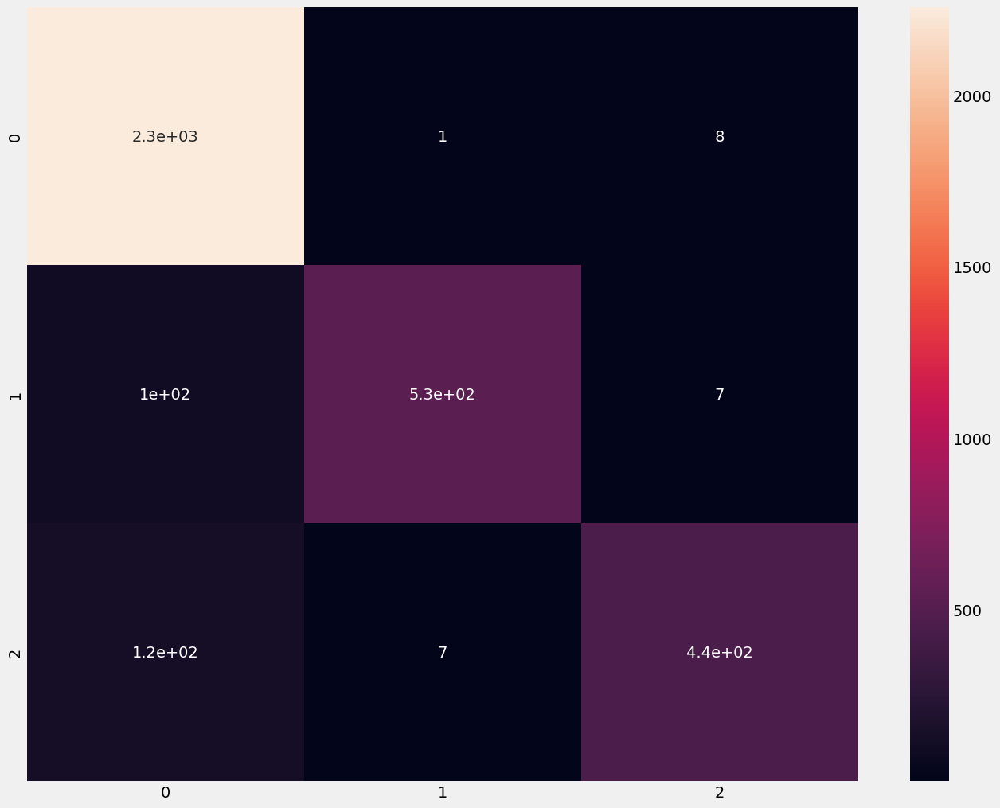

In [83]:
# Train the Gradient Boosting model
model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,y_train)

# Evaluate Model
y_pred_gb=model_gb.predict(X_test)
accuracy_gb=accuracy_score(y_test,y_pred_gb)*100

print('Accuracy: {:.2f}% '.format(accuracy_gb))
print('Precision: {:.2f}% '.format(precision_score(y_test,y_pred_gb,average='weighted')*100))
print('Recall: {:.2f}% '.format(recall_score(y_test,y_pred_gb,average='weighted')*100))
print('f1_score: {:.2f}% '.format(f1_score(y_test,y_pred_gb,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_gb),annot=True)
print(classification_report(y_test,y_pred_gb))
 

# Light Gradient Boosting classifier model

Accuracy:95.75% 
Precision:95.73% 
Recall:95.75% 
f1_score:95.72% 
                     precision    recall  f1-score   support

         Depression       0.96      0.98      0.97      2265
   Diabetes, Type 2       0.96      0.92      0.94       644
High Blood Pressure       0.93      0.89      0.91       577

           accuracy                           0.96      3486
          macro avg       0.95      0.93      0.94      3486
       weighted avg       0.96      0.96      0.96      3486



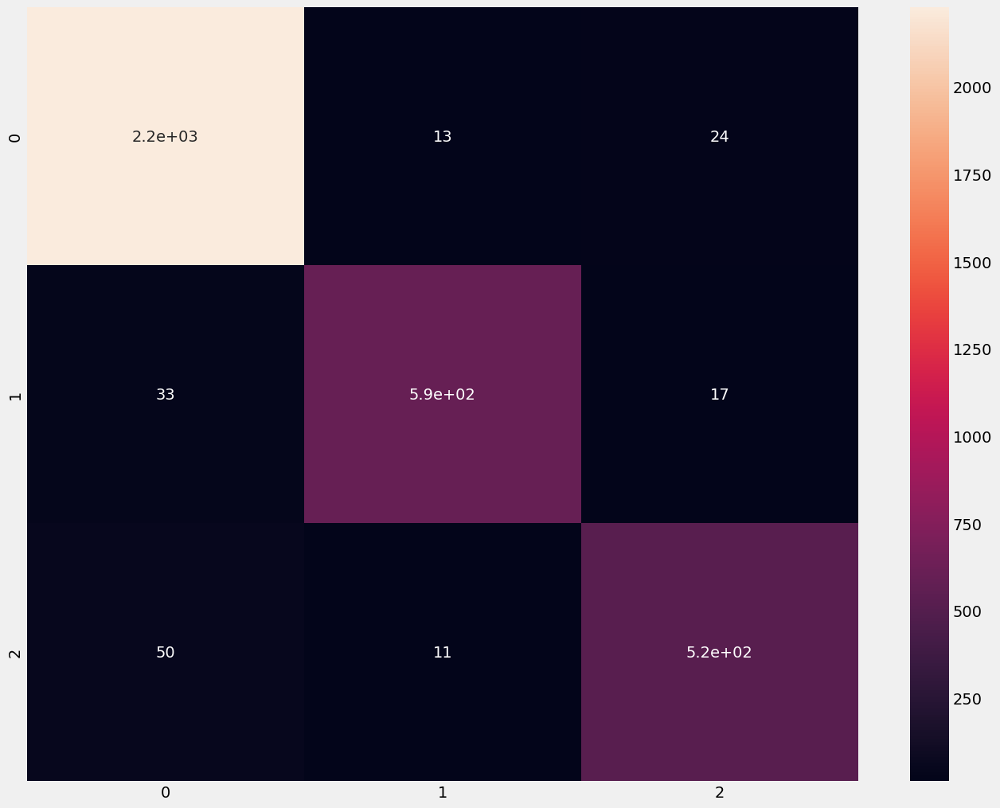

In [84]:
clf = LGBMClassifier(
        n_estimators=10000,
        learning_rate=0.10,
        num_leaves=30,
        subsample=.9,
        max_depth=7,
        reg_alpha=.1,
        reg_lambda=.1,
        min_split_gain=.01,
        min_child_weight=2,
        silent=-1,
        verbose=-1,
        )
model = clf.fit(X_train, y_train)

# Evaluate Model
y_pred_clf=model.predict(X_test)
accuracy_clf=accuracy_score(y_test,y_pred_clf)*100

print('Accuracy:{:.2f}% '.format(accuracy_clf))
print('Precision:{:.2f}% '.format(precision_score(y_test,y_pred_clf,average='weighted')*100))
print('Recall:{:.2f}% '.format(recall_score(y_test,y_pred_clf,average='weighted')*100))
print('f1_score:{:.2f}% '.format(f1_score(y_test,y_pred_clf,average='weighted')*100))

sn.heatmap(confusion_matrix(y_test, y_pred_clf),annot=True)
print(classification_report(y_test,y_pred_clf))
 

In [85]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

In [86]:
compare={"Model Name":['MultinomialNB','GradientBoosting','DecisionTree','SVC','LogisticRegression','RandomForest','LGBMClassifier'],
        "Accuracy Score":[accuracy_n,accuracy_gb,accuracy_dt,accuracy_svc,accuracy_lr,accuracy_en,accuracy_clf]}
barp=pd.DataFrame(compare)
print(barp)


           Model Name  Accuracy Score
0       MultinomialNB       88.640275
1    GradientBoosting       92.799771
2        DecisionTree       85.140562
3                 SVC       95.754446
4  LogisticRegression       88.640275
5        RandomForest       95.467585
6      LGBMClassifier       95.754446


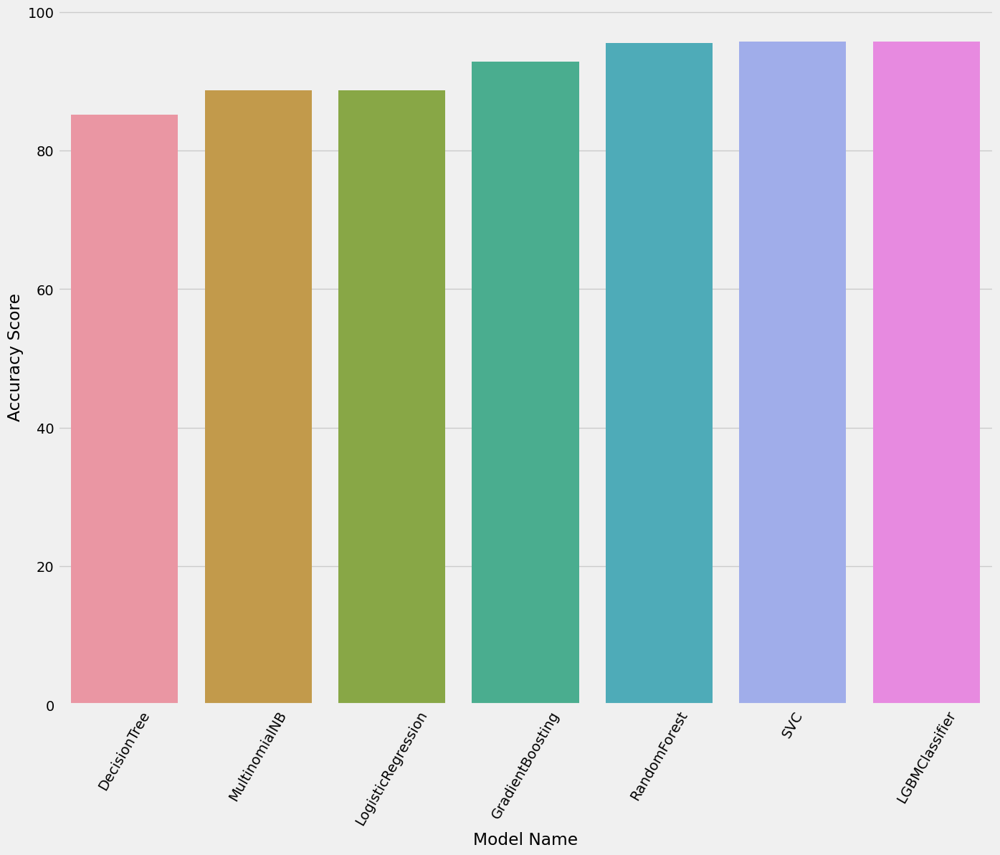

In [87]:
import matplotlib.pyplot as plt
barp.sort_values(by='Accuracy Score',inplace=True)
sn.barplot(x="Model Name",y="Accuracy Score",data=barp)
plt.xticks(rotation=60)
plt.show()

In [88]:
 new_df2["condition"] =  new_df2["condition"].str.lower()
new_df2["condition"] =  new_df2["condition"].str.lower()


In [89]:
X = vectorizer.fit_transform(new_df2['cleanReview'])

y = new_df2["condition"]

In [90]:
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, StratifiedKFold
import plotly.express as px
import numpy as np
import pandas as pd
from mlxtend.plotting import plot_learning_curves
from sklearn.preprocessing import LabelEncoder


from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.multiclass import OneVsRestClassifier
from nltk.corpus import stopwords
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from nltk.stem import WordNetLemmatizer, SnowballStemmer


In [91]:
def cross_val_multiple_classifiers(X, Y):
  classifiers = [MultinomialNB(), SGDClassifier(loss="modified_huber"), 
                 RandomForestClassifier(n_estimators=100), 
                 KNeighborsClassifier(n_neighbors=5)]
  labels = ['Multinomial Naive Bayes', 'SGD Classifier', 'Random Forest',  'KNN']
  clf_cv_mean = []
  clf_cv_std = []
  for clf, label in zip(classifiers, labels): 
      scores = cross_val_score(clf, X, Y, cv=4, scoring='accuracy')
      print ("Accuracy: %.2f (+/- %.2f) [%s]" %(scores.mean(), scores.std(), label))

# calling multiple classifiers on the vectorized features
cross_val_multiple_classifiers(X, y)

Accuracy: 0.89 (+/- 0.01) [Multinomial Naive Bayes]
Accuracy: 0.97 (+/- 0.01) [SGD Classifier]
Accuracy: 0.96 (+/- 0.00) [Random Forest]
Accuracy: 0.90 (+/- 0.01) [KNN]


# Stochastic gradient descent

# SGD Classifier is a linear classifier (SVM, logistic regression, a.o.) optimized by the SGD. These are two different concepts. While SGD is a optimization method, Logistic Regression or linear Support Vector Machine is a machine learning algorithm/model. 

In [92]:
from pickle import dump
from pickle import load
import pickle

In [94]:
pickle.dump(model_s,open('Drug.pkl','wb'))
pickled_model=pickle.load(open('Drug.pkl','rb'))

In [95]:
pickle_out = open("Drug.pkl","wb")
pickle.dump(model_s, pickle_out)
pickle_out.close()


In [96]:
pickled_model.score(X_test, y_test)

0.9575444635685599